In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
activity_minute=pd.read_csv('/content/ACTIVITY_MINUTE_1680274739070.csv')

In [ ]:
activity_minute

,date,time,steps
0,2018-09-30,16:06,87
1,2018-09-30,16:07,104
2,2018-09-30,16:08,105
3,2018-09-30,16:09,101
4,2018-09-30,16:10,105
...,...,...,...
33669,2023-03-20,19:48,66
33670,2023-03-20,19:49,74
33671,2023-03-20,19:50,20
33672,2023-03-20,19:51,36


In [ ]:
activity_minute.dtypes

date     object
time     object
steps     int64
dtype: object

In [ ]:
# changing the datatype of date column from object to datetime

activity_minute['date']=pd.to_datetime(activity_minute['date'])
activity_minute

,date,time,steps
0,2018-09-30,16:06,87
1,2018-09-30,16:07,104
2,2018-09-30,16:08,105
3,2018-09-30,16:09,101
4,2018-09-30,16:10,105
...,...,...,...
33669,2023-03-20,19:48,66
33670,2023-03-20,19:49,74
33671,2023-03-20,19:50,20
33672,2023-03-20,19:51,36


In [ ]:
activity_minute.dtypes

date     datetime64[ns]
time             object
steps             int64
dtype: object

In [ ]:
# changing the datatype of time column from object to datetime


activity_minute['time']=pd.to_datetime(activity_minute['time'],format='%H:%M').dt.time


In [ ]:
activity_minute

,date,time,steps
0,2018-09-30,16:06:00,87
1,2018-09-30,16:07:00,104
2,2018-09-30,16:08:00,105
3,2018-09-30,16:09:00,101
4,2018-09-30,16:10:00,105
...,...,...,...
33669,2023-03-20,19:48:00,66
33670,2023-03-20,19:49:00,74
33671,2023-03-20,19:50:00,20
33672,2023-03-20,19:51:00,36


In [ ]:
activity_minute.dtypes

date     datetime64[ns]
time             object
steps             int64
dtype: object

In [ ]:
# group by date to get starting time and ending time and total steps on each dates

activity_minute1=activity_minute.groupby('date').agg({'time':['min','max'],'steps':'sum'})

In [ ]:
activity_minute1

time           steps
                 min       max   sum
date                                
2018-09-30  16:06:00  18:29:00  3504
2018-10-02  10:51:00  10:51:00    11
2018-10-03  10:19:00  18:39:00  8746
2018-10-04  08:52:00  19:52:00  8634
2018-10-05  06:46:00  17:14:00  9198
...              ...       ...   ...
2023-03-07  15:57:00  18:05:00  2523
2023-03-08  16:04:00  17:59:00  2060
2023-03-13  20:09:00  20:37:00   445
2023-03-19  14:08:00  18:04:00  4168
2023-03-20  19:17:00  19:53:00  2804

[452 rows x 3 columns]

In [ ]:
# checking if the dataset has any null values or not

activity_minute1.isnull().sum()

time   min    0
       max    0
steps  sum    0
dtype: int64

In [ ]:
activity=pd.read_csv('/content/ACTIVITY_1679325863134.csv')
activity

,date,steps,distance,runDistance,calories
0,2018-09-30,3645,2629,111,93
1,2018-10-01,0,0,0,0
2,2018-10-02,11,7,0,1
3,2018-10-03,8746,6174,301,201
4,2018-10-04,8634,5833,451,195
...,...,...,...,...,...
1018,2023-03-16,0,0,0,0
1019,2023-03-17,0,0,0,0
1020,2023-03-18,0,0,0,0
1021,2023-03-19,4168,2730,166,89


In [ ]:
# changing the datatype of date column from object to datetime


activity['date']=pd.to_datetime(activity['date'])
activity.dtypes

date           datetime64[ns]
steps                   int64
distance                int64
runDistance             int64
calories                int64
dtype: object

In [ ]:
# checking if the dataset has any null values or not

activity.isnull().sum()

date           0
steps          0
distance       0
runDistance    0
calories       0
dtype: int64

In [ ]:
activity['steps'].count()

1023

In [ ]:
activity_minute1['steps'].count()

sum    452
dtype: int64

In [ ]:
# joining two tables, left join

act_merge=pd.merge(activity,activity_minute1,on='date',how='left')

<ipython-input-17-39cfbff42880>:1: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (1 levels on the left, 2 on the right)
  act_merge=pd.merge(activity,activity_minute1,on='date',how='left')


In [ ]:
act_merge.sample(10)

,date,steps,distance,runDistance,calories,"(time, min)","(time, max)","(steps, sum)"
632,2022-01-28,0,0,0,0,NaN,NaN,NaN
328,2021-03-06,3991,2846,81,96,19:01:00,21:18:00,3991.0
198,2020-10-27,0,0,0,0,NaN,NaN,NaN
462,2021-07-23,0,0,0,0,NaN,NaN,NaN
950,2023-01-04,2270,1484,64,45,21:55:00,22:49:00,2270.0
255,2020-12-23,0,0,0,0,NaN,NaN,NaN
913,2022-11-28,85,56,13,4,13:31:00,13:44:00,85.0
451,2021-07-12,0,0,0,0,NaN,NaN,NaN
650,2022-02-15,3686,2665,122,90,10:38:00,17:10:00,3686.0
699,2022-04-05,0,0,0,0,NaN,NaN,NaN


In [ ]:
act_merge.isnull().sum()

date              0
steps             0
distance          0
runDistance       0
calories          0
(time, min)     571
(time, max)     571
(steps, sum)    571
dtype: int64

In [ ]:
# filling null values with zero

act_merge=act_merge.fillna(0)

In [ ]:
act_merge

,date,steps,distance,runDistance,calories,"(time, min)","(time, max)","(steps, sum)"
0,2018-09-30,3645,2629,111,93,16:06:00,18:29:00,3504.0
1,2018-10-01,0,0,0,0,0,0,0.0
2,2018-10-02,11,7,0,1,10:51:00,10:51:00,11.0
3,2018-10-03,8746,6174,301,201,10:19:00,18:39:00,8746.0
4,2018-10-04,8634,5833,451,195,08:52:00,19:52:00,8634.0
...,...,...,...,...,...,...,...,...
1018,2023-03-16,0,0,0,0,0,0,0.0
1019,2023-03-17,0,0,0,0,0,0,0.0
1020,2023-03-18,0,0,0,0,0,0,0.0
1021,2023-03-19,4168,2730,166,89,14:08:00,18:04:00,4168.0


In [ ]:
# adding the year, month and date columns to the dataset

act_merge['year']=act_merge['date'].dt.year
act_merge['month']=act_merge['date'].dt.month
act_merge['day']=act_merge['date'].dt.day

act_merge

,date,steps,distance,runDistance,calories,"(time, min)","(time, max)","(steps, sum)",year,month,day
0,2018-09-30,3645,2629,111,93,16:06:00,18:29:00,3504.0,2018,9,30
1,2018-10-01,0,0,0,0,0,0,0.0,2018,10,1
2,2018-10-02,11,7,0,1,10:51:00,10:51:00,11.0,2018,10,2
3,2018-10-03,8746,6174,301,201,10:19:00,18:39:00,8746.0,2018,10,3
4,2018-10-04,8634,5833,451,195,08:52:00,19:52:00,8634.0,2018,10,4
...,...,...,...,...,...,...,...,...,...,...,...
1018,2023-03-16,0,0,0,0,0,0,0.0,2023,3,16
1019,2023-03-17,0,0,0,0,0,0,0.0,2023,3,17
1020,2023-03-18,0,0,0,0,0,0,0.0,2023,3,18
1021,2023-03-19,4168,2730,166,89,14:08:00,18:04:00,4168.0,2023,3,19


In [ ]:
# adding the year, month and date columns to the dataset

#act_merge['year'] = pd.DatetimeIndex(act_merge['date']).year
#act_merge['month'] = pd.DatetimeIndex(act_merge['date']).month
#act_merge['day'] = pd.DatetimeIndex(act_merge['date']).day

In [ ]:
act_merge

,date,steps,distance,runDistance,calories,"(time, min)","(time, max)","(steps, sum)",year,month,day
0,2018-09-30,3645,2629,111,93,16:06:00,18:29:00,3504.0,2018,9,30
1,2018-10-01,0,0,0,0,0,0,0.0,2018,10,1
2,2018-10-02,11,7,0,1,10:51:00,10:51:00,11.0,2018,10,2
3,2018-10-03,8746,6174,301,201,10:19:00,18:39:00,8746.0,2018,10,3
4,2018-10-04,8634,5833,451,195,08:52:00,19:52:00,8634.0,2018,10,4
...,...,...,...,...,...,...,...,...,...,...,...
1018,2023-03-16,0,0,0,0,0,0,0.0,2023,3,16
1019,2023-03-17,0,0,0,0,0,0,0.0,2023,3,17
1020,2023-03-18,0,0,0,0,0,0,0.0,2023,3,18
1021,2023-03-19,4168,2730,166,89,14:08:00,18:04:00,4168.0,2023,3,19


In [ ]:
# making a copy of the dataframe

act_merge_copy=act_merge.copy()

In [ ]:
act_merge_copy

,date,steps,distance,runDistance,calories,"(time, min)","(time, max)","(steps, sum)",year,month,day
0,2018-09-30,3645,2629,111,93,16:06:00,18:29:00,3504.0,2018,9,30
1,2018-10-01,0,0,0,0,0,0,0.0,2018,10,1
2,2018-10-02,11,7,0,1,10:51:00,10:51:00,11.0,2018,10,2
3,2018-10-03,8746,6174,301,201,10:19:00,18:39:00,8746.0,2018,10,3
4,2018-10-04,8634,5833,451,195,08:52:00,19:52:00,8634.0,2018,10,4
...,...,...,...,...,...,...,...,...,...,...,...
1018,2023-03-16,0,0,0,0,0,0,0.0,2023,3,16
1019,2023-03-17,0,0,0,0,0,0,0.0,2023,3,17
1020,2023-03-18,0,0,0,0,0,0,0.0,2023,3,18
1021,2023-03-19,4168,2730,166,89,14:08:00,18:04:00,4168.0,2023,3,19


In [ ]:
# dropping all the zero value rows

act_merge_copy=act_merge_copy.drop(act_merge_copy[act_merge_copy['steps']==0].index)

In [ ]:
act_merge_copy

,date,steps,distance,runDistance,calories,"(time, min)","(time, max)","(steps, sum)",year,month,day
0,2018-09-30,3645,2629,111,93,16:06:00,18:29:00,3504.0,2018,9,30
2,2018-10-02,11,7,0,1,10:51:00,10:51:00,11.0,2018,10,2
3,2018-10-03,8746,6174,301,201,10:19:00,18:39:00,8746.0,2018,10,3
4,2018-10-04,8634,5833,451,195,08:52:00,19:52:00,8634.0,2018,10,4
5,2018-10-05,9198,6223,591,203,06:46:00,17:14:00,9198.0,2018,10,5
...,...,...,...,...,...,...,...,...,...,...,...
1009,2023-03-07,2523,1650,243,58,15:57:00,18:05:00,2523.0,2023,3,7
1010,2023-03-08,2060,1351,107,44,16:04:00,17:59:00,2060.0,2023,3,8
1015,2023-03-13,445,291,26,8,20:09:00,20:37:00,445.0,2023,3,13
1021,2023-03-19,4168,2730,166,89,14:08:00,18:04:00,4168.0,2023,3,19


In [ ]:
# creating columns and storing year,month,day,weeknumber,dayname from date column

act_merge_copy['week']=pd.to_datetime(act_merge_copy.date).dt.week
act_merge_copy['dayName']=pd.to_datetime(act_merge_copy.date).dt.strftime('%A')

act_merge_copy

<ipython-input-29-ab31028ea459>:1: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  act_merge_copy['week']=pd.to_datetime(act_merge_copy.date).dt.week


,date,steps,distance,runDistance,calories,"(time, min)","(time, max)","(steps, sum)",year,month,day,week,dayName
0,2018-09-30,3645,2629,111,93,16:06:00,18:29:00,3504.0,2018,9,30,39,Sunday
2,2018-10-02,11,7,0,1,10:51:00,10:51:00,11.0,2018,10,2,40,Tuesday
3,2018-10-03,8746,6174,301,201,10:19:00,18:39:00,8746.0,2018,10,3,40,Wednesday
4,2018-10-04,8634,5833,451,195,08:52:00,19:52:00,8634.0,2018,10,4,40,Thursday
5,2018-10-05,9198,6223,591,203,06:46:00,17:14:00,9198.0,2018,10,5,40,Friday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1009,2023-03-07,2523,1650,243,58,15:57:00,18:05:00,2523.0,2023,3,7,10,Tuesday
1010,2023-03-08,2060,1351,107,44,16:04:00,17:59:00,2060.0,2023,3,8,10,Wednesday
1015,2023-03-13,445,291,26,8,20:09:00,20:37:00,445.0,2023,3,13,11,Monday
1021,2023-03-19,4168,2730,166,89,14:08:00,18:04:00,4168.0,2023,3,19,11,Sunday


In [ ]:
# creating a copy of dataframe, adding new column names

act_merge_copy1=act_merge_copy.copy()
act_merge_copy1.to_string(header=False)
act_merge_copy1.columns=['date','steps','distance','runDistance','calories','time_min','time_max','steps_sum','year','month','day','week','dayName']

In [ ]:
act_merge_copy1

,date,steps,distance,runDistance,calories,time_min,time_max,steps_sum,year,month,day,week,dayName
0,2018-09-30,3645,2629,111,93,16:06:00,18:29:00,3504.0,2018,9,30,39,Sunday
2,2018-10-02,11,7,0,1,10:51:00,10:51:00,11.0,2018,10,2,40,Tuesday
3,2018-10-03,8746,6174,301,201,10:19:00,18:39:00,8746.0,2018,10,3,40,Wednesday
4,2018-10-04,8634,5833,451,195,08:52:00,19:52:00,8634.0,2018,10,4,40,Thursday
5,2018-10-05,9198,6223,591,203,06:46:00,17:14:00,9198.0,2018,10,5,40,Friday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1009,2023-03-07,2523,1650,243,58,15:57:00,18:05:00,2523.0,2023,3,7,10,Tuesday
1010,2023-03-08,2060,1351,107,44,16:04:00,17:59:00,2060.0,2023,3,8,10,Wednesday
1015,2023-03-13,445,291,26,8,20:09:00,20:37:00,445.0,2023,3,13,11,Monday
1021,2023-03-19,4168,2730,166,89,14:08:00,18:04:00,4168.0,2023,3,19,11,Sunday


In [ ]:
# checking datatypes

act_merge_copy1.dtypes

date           datetime64[ns]
steps                   int64
distance                int64
runDistance             int64
calories                int64
time_min               object
time_max               object
steps_sum             float64
year                    int64
month                   int64
day                     int64
week                    int64
dayName                object
dtype: object

In [ ]:
#act_merge_copy1['time_min']=pd.to_datetime(act_merge_copy1['time_min'],format='%H:%M:%S')
#act_merge_copy1

In [ ]:
# getting the total minutes from two time stamps by subtracting them

act_merge_copy1['time_diff_mins']=(pd.to_datetime(act_merge_copy1['time_max'], format='%H:%M:%S') - pd.to_datetime(act_merge_copy1['time_min'], format='%H:%M:%S')).dt.total_seconds()/60
act_merge_copy1

,date,steps,distance,runDistance,calories,time_min,time_max,steps_sum,year,month,day,week,dayName,time_diff_mins
0,2018-09-30,3645,2629,111,93,16:06:00,18:29:00,3504.0,2018,9,30,39,Sunday,143.0
2,2018-10-02,11,7,0,1,10:51:00,10:51:00,11.0,2018,10,2,40,Tuesday,0.0
3,2018-10-03,8746,6174,301,201,10:19:00,18:39:00,8746.0,2018,10,3,40,Wednesday,500.0
4,2018-10-04,8634,5833,451,195,08:52:00,19:52:00,8634.0,2018,10,4,40,Thursday,660.0
5,2018-10-05,9198,6223,591,203,06:46:00,17:14:00,9198.0,2018,10,5,40,Friday,628.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1009,2023-03-07,2523,1650,243,58,15:57:00,18:05:00,2523.0,2023,3,7,10,Tuesday,128.0
1010,2023-03-08,2060,1351,107,44,16:04:00,17:59:00,2060.0,2023,3,8,10,Wednesday,115.0
1015,2023-03-13,445,291,26,8,20:09:00,20:37:00,445.0,2023,3,13,11,Monday,28.0
1021,2023-03-19,4168,2730,166,89,14:08:00,18:04:00,4168.0,2023,3,19,11,Sunday,236.0


In [ ]:
activity_stage=pd.read_csv('/content/ACTIVITY_STAGE_1679325864177.csv')
activity_stage


,date,start,stop,distance,calories,steps
0,2018-09-30,16:06,16:11,407,12,559
1,2018-09-30,16:26,16:41,304,10,465
2,2018-09-30,17:32,17:54,139,4,213
3,2018-09-30,18:03,18:16,832,29,1102
4,2018-09-30,18:17,18:29,794,25,1075
...,...,...,...,...,...,...
2690,2023-03-19,17:12,17:25,375,11,568
2691,2023-03-19,17:31,17:36,92,3,141
2692,2023-03-19,17:46,17:58,243,7,373
2693,2023-03-20,19:17,19:21,155,4,238


In [ ]:
activity_stage['date']=pd.to_datetime(activity_stage['date'])
activity_stage.dtypes

date        datetime64[ns]
start               object
stop                object
distance             int64
calories             int64
steps                int64
dtype: object

In [ ]:
# group by date and counting the frequency,sorting by date ascending order

activity_stage1=pd.DataFrame(activity_stage.groupby('date')['start'].count()).sort_values(by='date',ascending=True).reset_index()
activity_stage1



,date,start
0,2018-09-30,5
1,2018-10-03,12
2,2018-10-04,12
3,2018-10-05,14
4,2018-10-06,5
...,...,...
433,2023-03-07,6
434,2023-03-08,7
435,2023-03-13,1
436,2023-03-19,9


In [ ]:
# joining to the dataframe

act_merge_copy1=pd.merge(act_merge_copy1,activity_stage1,on='date',how='left')


In [ ]:
act_merge_copy1

,date,steps,distance,runDistance,calories,time_min,time_max,steps_sum,year,month,day,week,dayName,time_diff_mins,start
0,2018-09-30,3645,2629,111,93,16:06:00,18:29:00,3504.0,2018,9,30,39,Sunday,143.0,5.0
1,2018-10-02,11,7,0,1,10:51:00,10:51:00,11.0,2018,10,2,40,Tuesday,0.0,NaN
2,2018-10-03,8746,6174,301,201,10:19:00,18:39:00,8746.0,2018,10,3,40,Wednesday,500.0,12.0
3,2018-10-04,8634,5833,451,195,08:52:00,19:52:00,8634.0,2018,10,4,40,Thursday,660.0,12.0
4,2018-10-05,9198,6223,591,203,06:46:00,17:14:00,9198.0,2018,10,5,40,Friday,628.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,2023-03-07,2523,1650,243,58,15:57:00,18:05:00,2523.0,2023,3,7,10,Tuesday,128.0,6.0
446,2023-03-08,2060,1351,107,44,16:04:00,17:59:00,2060.0,2023,3,8,10,Wednesday,115.0,7.0
447,2023-03-13,445,291,26,8,20:09:00,20:37:00,445.0,2023,3,13,11,Monday,28.0,1.0
448,2023-03-19,4168,2730,166,89,14:08:00,18:04:00,4168.0,2023,3,19,11,Sunday,236.0,9.0


In [ ]:
!pip install pandas-profiling
import pandas_profiling
act_merge_copy1.profile_report()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Text(0.5, 1.0, 'Box plot of Calories by day of the month')

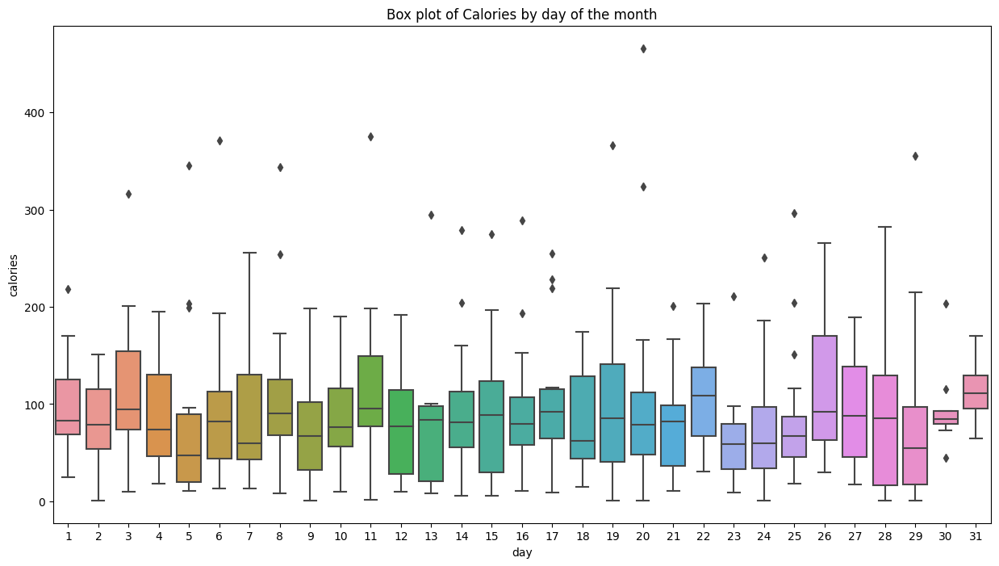

In [ ]:
# figure size
plt.figure(figsize=(15,8))

# Usual boxplot
ax = sns.boxplot(x='day', y='calories', data=act_merge_copy1)

ax.set_title('Box plot of Calories by day of the month')

[Text(0.5, 1.0, 'Day wise calories'), Text(0.5, 0, 'Day Name')]

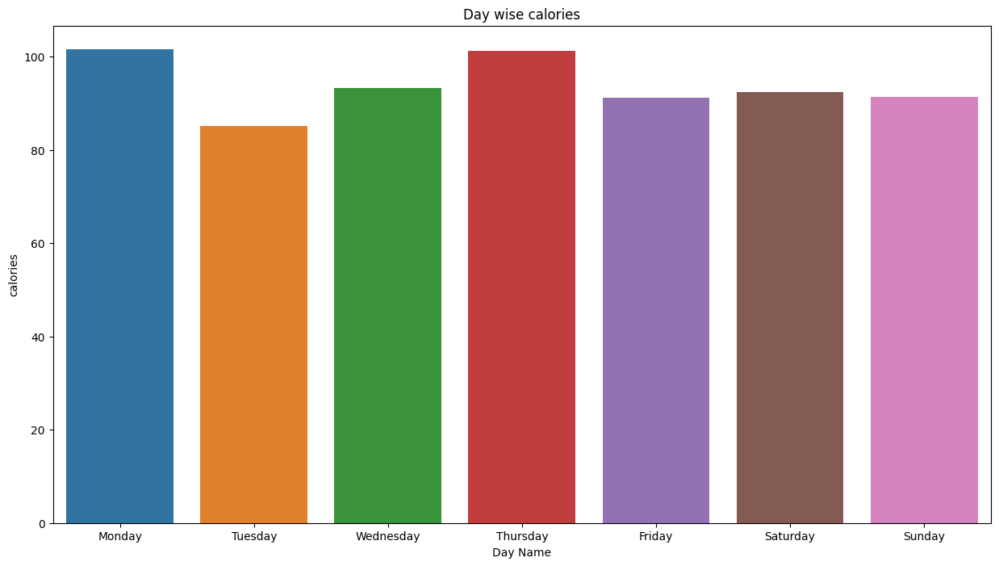

In [ ]:
plt.figure(figsize=(15,8))
order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday","Sunday"]
sns.barplot(x='dayName',y='calories',data=act_merge_copy1,order=order,errorbar=None).set(title='Day wise calories',xlabel='Day Name')

Text(0.5, 1.0, 'Scatterplot of calories and minutes')

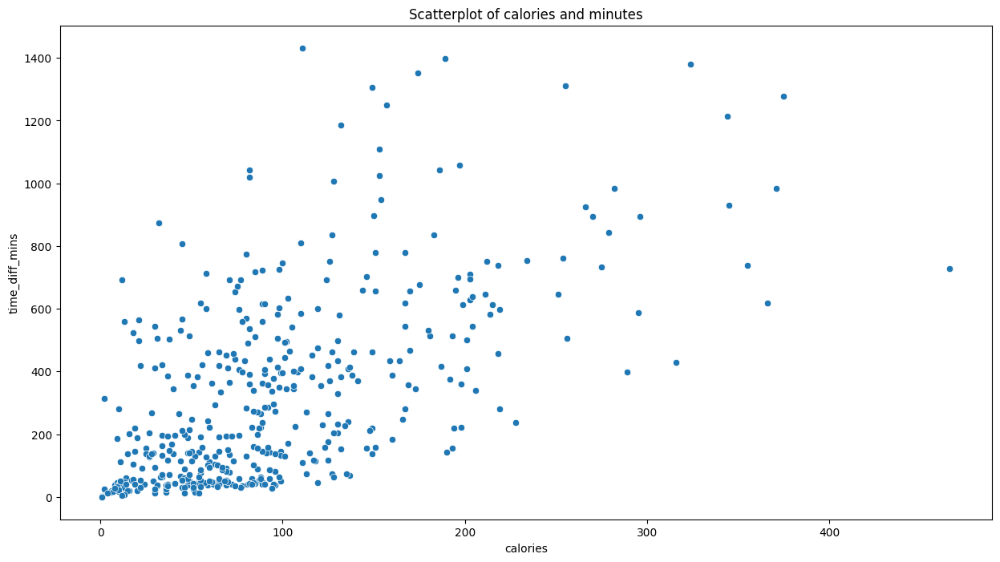

In [ ]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot
ax = sns.scatterplot(x='calories', y='time_diff_mins', data=act_merge_copy1)

ax.set_title('Scatterplot of calories and minutes')

Text(0.5, 1.0, 'Scatterplot of steps and distance')

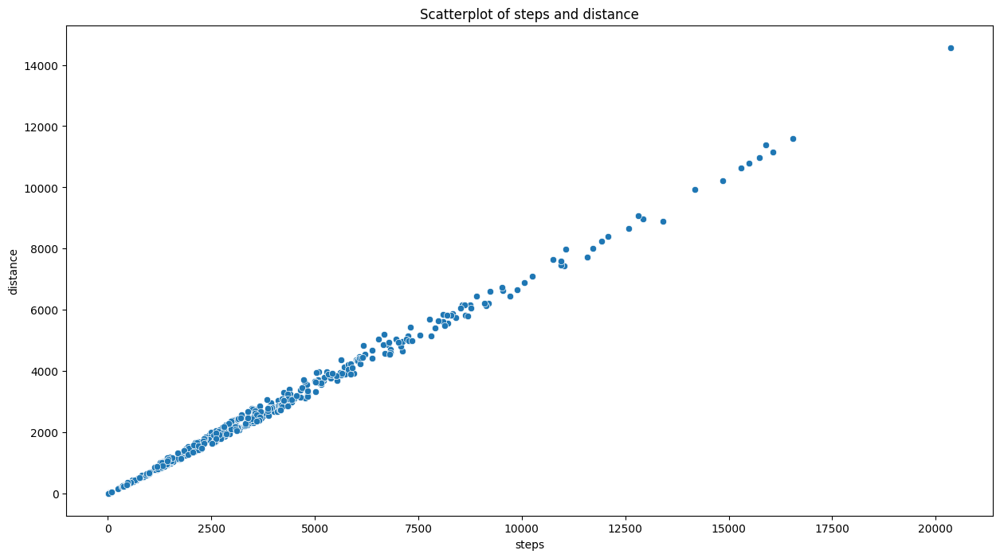

In [ ]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot
ax = sns.scatterplot(x='steps', y='distance', data=act_merge_copy1)

ax.set_title('Scatterplot of steps and distance')

Text(0.5, 1.0, 'Scatterplot of calories and steps')

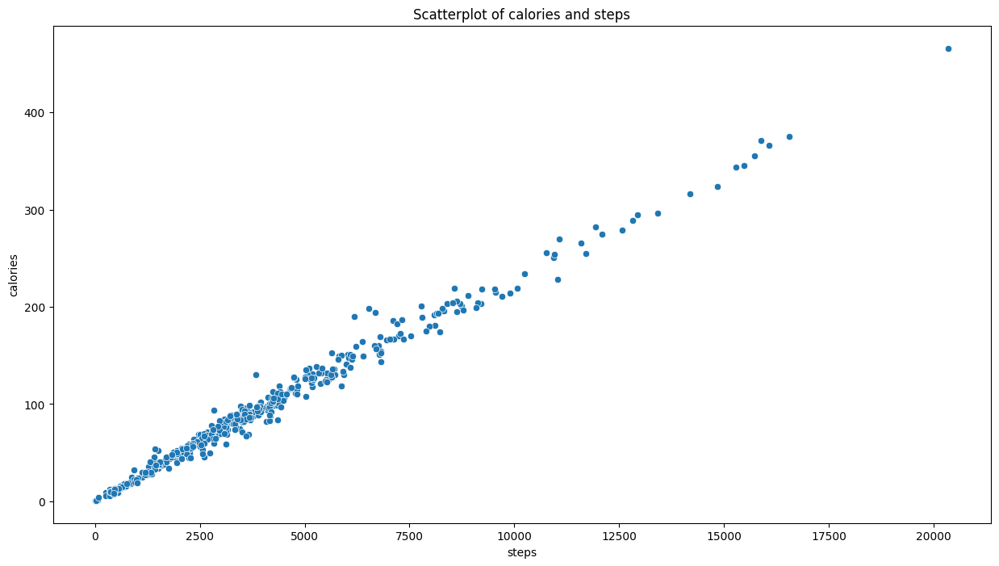

In [ ]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot
ax = sns.scatterplot(x='steps', y='calories', data=act_merge_copy1)

ax.set_title('Scatterplot of calories and steps')

Text(0.5, 1.0, 'Scatterplot of distance and calories')

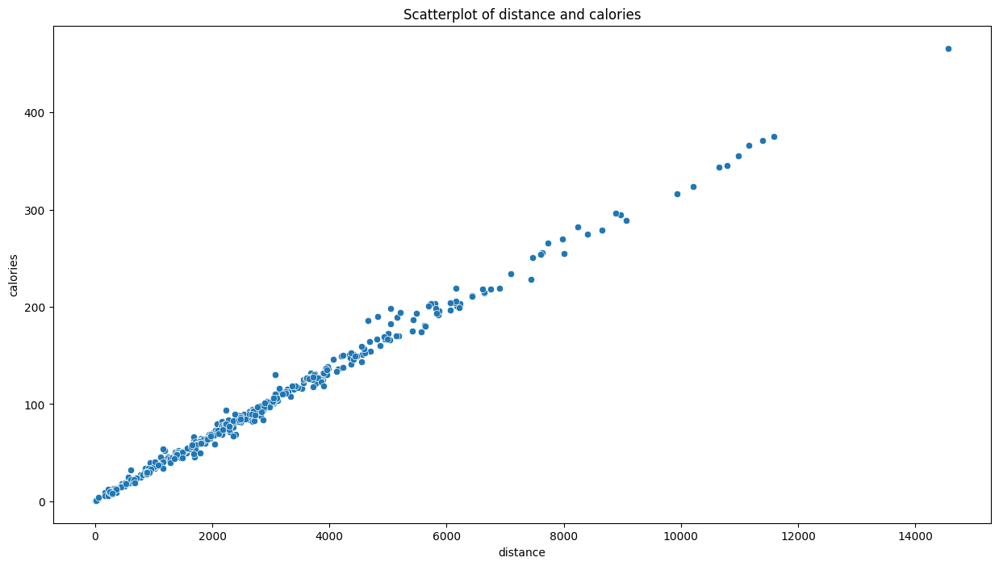

In [ ]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot
ax = sns.scatterplot(x='distance', y='calories', data=act_merge_copy1)

ax.set_title('Scatterplot of distance and calories')

Text(0.5, 1.0, 'Scatterplot of breaks and minutes')

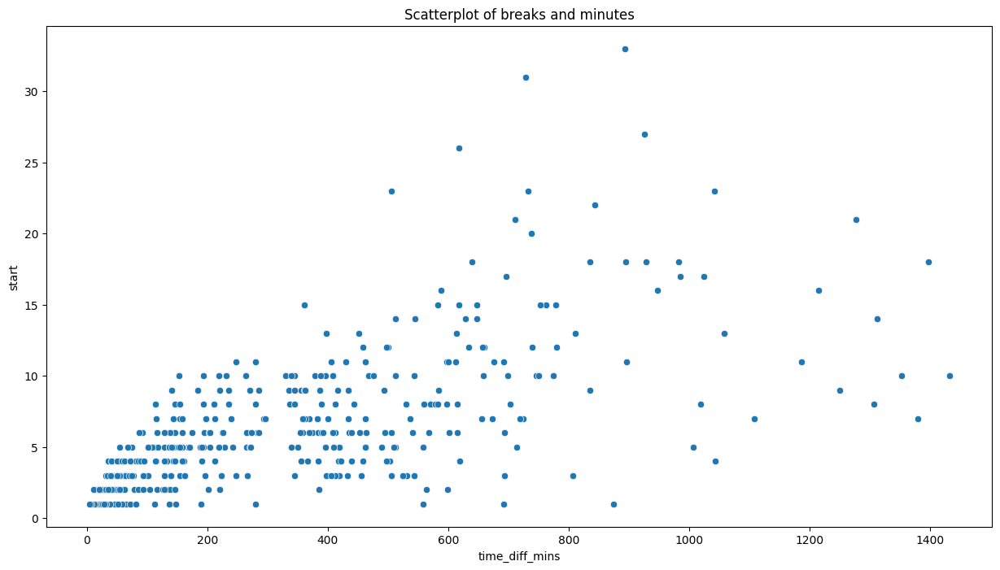

In [ ]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot
ax = sns.scatterplot(x='time_diff_mins', y='start', data=act_merge_copy1)

ax.set_title('Scatterplot of breaks and minutes')

[Text(0.5, 1.0, 'Year wise steps'), Text(0.5, 0, 'Year')]

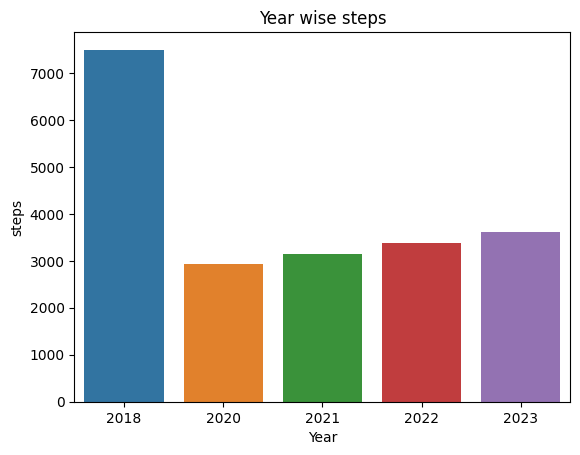

In [ ]:
sns.barplot(x='year',y='steps',data=act_merge_copy1,errorbar=None).set(title='Year wise total steps',xlabel='Year')


In [ ]:
heart_rate=pd.read_csv('/content/HEARTRATE_AUTO_1679325868716.csv')
heart_rate

,date,time,heartRate
0,2018-09-30,16:16,78
1,2018-09-30,16:17,81
2,2018-10-01,05:35,69
3,2018-10-01,23:26,76
4,2018-10-01,23:27,83
...,...,...,...
5515,2023-03-20,19:49,108
5516,2023-03-20,19:50,108
5517,2023-03-20,19:51,105
5518,2023-03-20,19:52,106


In [ ]:
# checking for null values

heart_rate.isnull().sum()

date         0
time         0
heartRate    0
dtype: int64

In [ ]:
 
heart_rate.max()

date         2023-03-20
time              23:59
heartRate           175
dtype: object

In [ ]:
heart_rate.min()

date         2018-09-30
time              00:00
heartRate            44
dtype: object

In [ ]:
heart_rate.mean()

<ipython-input-115-b5319c3c38f2>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  heart_rate.mean()


heartRate    94.672645
dtype: float64

In [ ]:
heart_rate.median()

<ipython-input-116-d197021f3f22>:1: FutureWarning: The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  heart_rate.median()


heartRate    96.0
dtype: float64

In [ ]:
heart_rate_mean=heart_rate.groupby('date')['heartRate'].mean().reset_index()
heart_rate_mean

,date,heartRate
0,2018-09-30,79.500000
1,2018-10-01,84.166667
2,2018-10-02,86.000000
3,2018-10-03,87.000000
4,2018-10-04,78.333333
...,...,...
158,2023-03-08,98.416667
159,2023-03-09,116.000000
160,2023-03-13,108.241379
161,2023-03-19,100.477273


Text(0, 0.5, 'heart rate')

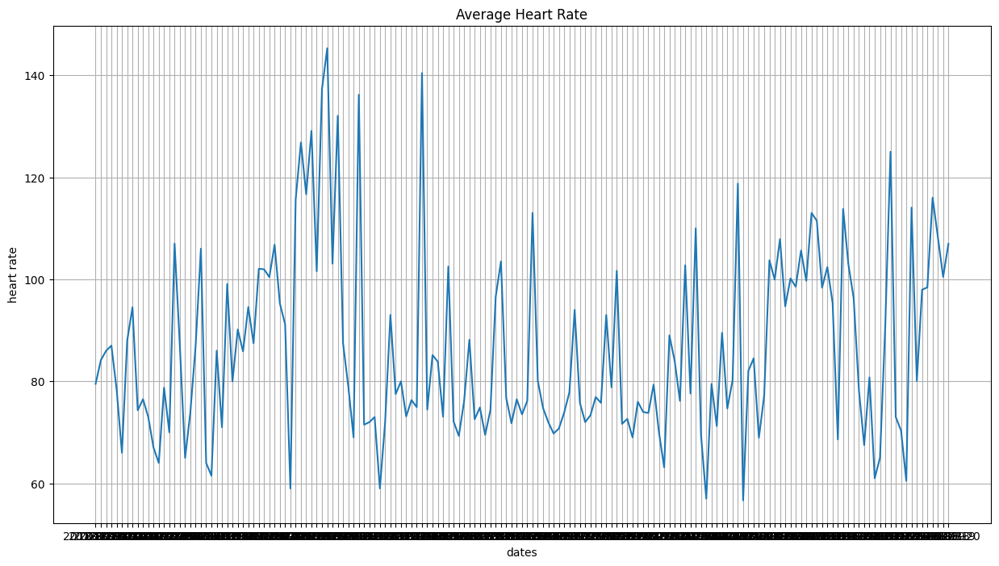

In [ ]:
plt.figure(figsize=(15,8))
plt.plot(heart_rate_mean['date'],heart_rate_mean['heartRate'])
plt.grid()
plt.title('Average Heart Rate')
plt.xlabel('dates')
plt.ylabel('heart rate')